In [1]:
import pandas as pd
import datetime as dt

In [68]:
data = pd.read_csv('data.csv')

In [69]:
for x in data.columns[171:]:
    print(x, data[x].isna().sum())

percentile_rank_age_65_and_older 17835
percentile_rank_age_17_and_younger 17835
percentile_rank_disabled 17835
percentile_rank_single_parent_households 17835
percentile_rank_household_comp_disability_theme 17835
percentile_rank_minorities 17835
percentile_rank_limited_english_abilities 17835
percentile_rank_minority_status_and_language_theme 17835
percentile_rank_multi_unit_housing 17835
percentile_rank_mobile_homes 17835
percentile_rank_overcrowding 17835
percentile_rank_no_vehicle 17835
percentile_rank_institutionalized_in_group_quarters 17835
percentile_rank_housing_and_transportation 17835
percentile_rank_social_vulnerability 17835
km_to_closest_station 17835
CALL 84360
ELEV_M 17835
station_id 34239
station_name 34239
mean_temp 34244
min_temp 34399
max_temp 35222
dewpoint 87536
sea_level_pressure 387426
station_pressure 134979
visibility 98906
wind_speed 69244
max_wind_speed 72664
wind_gust 333692
precipitation 106830
precip_flag 106830
fog 34239
rain 34239
snow 34239
hail 34239
th

In [70]:
sub_data = data.iloc[:, 171:]
sub_data['entity'] = data['state'] + '-' + data['county']

In [71]:
all_entities = sub_data['entity'].unique()


In [88]:
# number of NAs for each column
num_na_df = sub_data.isna().sum().reset_index().rename(
    columns = {'index':'col', 0:'num_na'}).sort_values(by = 'num_na', ascending = False)

# columns with NAs
num_na_df = num_na_df[num_na_df['num_na'] != 0]
num_na_df

,col,num_na
24,sea_level_pressure,387426
29,wind_gust,333692
55,date_stay_at_home_effective,151112
54,date_stay_at_home_announced,151112
25,station_pressure,134979
53,dewpoint_15d_avg,111689
30,precipitation,106830
31,precip_flag,106830
52,dewpoint_10d_avg,104846
26,visibility,98906


In [90]:
columns_to_check = sub_data.columns[sub_data.columns != 'entity']

# Dictionary to store entities for each column
entities_all_na_by_column = {}

# Iterate over each column
for column in columns_to_check:
    # Find entities where all values for the current column are NaN
    entities_all_na = sub_data[sub_data[column].isna()]['entity'].unique()
    entities_all_na_by_column[column] = entities_all_na

# Print the result
for column, entities in entities_all_na_by_column.items():
    print(f"Entities where all values for '{column}' are NaN: {entities}")

Entities where all values for 'percentile_rank_age_65_and_older' are NaN: ['Virgin Islands-St. Croix' 'Virgin Islands-St. John'
 'Virgin Islands-St. Thomas' 'Puerto Rico-Adjuntas' 'Puerto Rico-Aguada'
 'Puerto Rico-Aguadilla' 'Puerto Rico-Aguas Buenas' 'Puerto Rico-Aibonito'
 'Puerto Rico-Anasco' 'Puerto Rico-Arecibo' 'Puerto Rico-Arroyo'
 'Puerto Rico-Barceloneta' 'Puerto Rico-Barranquitas'
 'Puerto Rico-Bayamon' 'Puerto Rico-Cabo Rojo' 'Puerto Rico-Caguas'
 'Puerto Rico-Camuy' 'Puerto Rico-Canovanas' 'Puerto Rico-Carolina'
 'Puerto Rico-Catano' 'Puerto Rico-Cayey' 'Puerto Rico-Ceiba'
 'Puerto Rico-Ciales' 'Puerto Rico-Cidra' 'Puerto Rico-Coamo'
 'Puerto Rico-Comerio' 'Puerto Rico-Corozal' 'Puerto Rico-Dorado'
 'Puerto Rico-Fajardo' 'Puerto Rico-Florida' 'Puerto Rico-Guanica'
 'Puerto Rico-Guayama' 'Puerto Rico-Guayanilla' 'Puerto Rico-Guaynabo'
 'Puerto Rico-Gurabo' 'Puerto Rico-Hatillo' 'Puerto Rico-Hormigueros'
 'Puerto Rico-Humacao' 'Puerto Rico-Isabela' 'Puerto Rico-Jayuya'
 'Pue

In [95]:
# Get a list of all column names excluding 'entity'
to_check = sub_data.columns[sub_data.columns != 'entity']

# Dictionary to store entities for each column
entities_all_na_by_col = {}

# Iterate over each column
for col in to_check:
    # Find entities where all values for the current column are NaN
    entities_all_na = sub_data[sub_data[col].isna()]['entity'].unique()
    entities_all_na_by_col[col] = set(entities_all_na)

# Find common entities across all columns
common_entities = set.intersection(*entities_all_na_by_col.values())

print(common_entities)


{'Puerto Rico-Guaynabo', 'Puerto Rico-Sabana Grande', 'Puerto Rico-Toa Baja', 'Puerto Rico-Ciales', 'Puerto Rico-Luquillo', 'Puerto Rico-Cayey', 'Puerto Rico-San German', 'Puerto Rico-Santa Isabel', 'Puerto Rico-Camuy', 'Puerto Rico-Ponce', 'Puerto Rico-Quebradillas', 'Puerto Rico-Vega Baja', 'Puerto Rico-Culebra', 'Puerto Rico-Ceiba', 'Virgin Islands-St. Thomas', 'Puerto Rico-San Lorenzo', 'Puerto Rico-Jayuya', 'Puerto Rico-Fajardo', 'Puerto Rico-Aguadilla', 'Puerto Rico-Morovis', 'Puerto Rico-Loiza', 'Puerto Rico-Barranquitas', 'Puerto Rico-Manati', 'Puerto Rico-San Juan', 'Puerto Rico-Coamo', 'Puerto Rico-Vega Alta', 'Puerto Rico-Lajas', 'Puerto Rico-Gurabo', 'Puerto Rico-Anasco', 'Puerto Rico-Corozal', 'Virgin Islands-St. John', 'Puerto Rico-Canovanas', 'Puerto Rico-Trujillo Alto', 'Puerto Rico-Moca', 'Puerto Rico-Salinas', 'Puerto Rico-Comerio', 'Puerto Rico-Rincon', 'Puerto Rico-Maunabo', 'Puerto Rico-Yauco', 'Puerto Rico-Cabo Rojo', 'Puerto Rico-Arroyo', 'Puerto Rico-Juana Diaz'

In [96]:
len(common_entities)

83

In [97]:
na_percentage = sub_data.isna().mean() * 100
print(na_percentage)

percentile_rank_age_65_and_older                        2.256649
percentile_rank_age_17_and_younger                      2.256649
percentile_rank_disabled                                2.256649
percentile_rank_single_parent_households                2.256649
percentile_rank_household_comp_disability_theme         2.256649
percentile_rank_minorities                              2.256649
percentile_rank_limited_english_abilities               2.256649
percentile_rank_minority_status_and_language_theme      2.256649
percentile_rank_multi_unit_housing                      2.256649
percentile_rank_mobile_homes                            2.256649
percentile_rank_overcrowding                            2.256649
percentile_rank_no_vehicle                              2.256649
percentile_rank_institutionalized_in_group_quarters     2.256649
percentile_rank_housing_and_transportation              2.256649
percentile_rank_social_vulnerability                    2.256649
km_to_closest_station    

In [102]:
features_to_drop = ['wind_gust', 'sea_level_pressure']

# Drop rows where entity is in common entities
sub_data_filtered = sub_data[~sub_data['entity'].isin(common_entities)]


# Calculate the percentage of NaN values for each column in the filtered DataFrame
na_percentage_filtered = sub_data_filtered.isna().mean() * 100

print(na_percentage_filtered)

percentile_rank_age_65_and_older                        0.021096
percentile_rank_age_17_and_younger                      0.021096
percentile_rank_disabled                                0.021096
percentile_rank_single_parent_households                0.021096
percentile_rank_household_comp_disability_theme         0.021096
percentile_rank_minorities                              0.021096
percentile_rank_limited_english_abilities               0.021096
percentile_rank_minority_status_and_language_theme      0.021096
percentile_rank_multi_unit_housing                      0.021096
percentile_rank_mobile_homes                            0.021096
percentile_rank_overcrowding                            0.021096
percentile_rank_no_vehicle                              0.021096
percentile_rank_institutionalized_in_group_quarters     0.021096
percentile_rank_housing_and_transportation              0.021096
percentile_rank_social_vulnerability                    0.021096
km_to_closest_station    

In [105]:
features_to_drop = ['wind_gust', 'sea_level_pressure']

# Drop rows where entity is in common entities
sub_data_filtered = sub_data[~sub_data['entity'].isin(common_entities)]

# Drop specific features
sub_data_filtered = sub_data_filtered.drop(features_to_drop, axis=1)

# Calculate the percentage of NaN values for each column in the filtered DataFrame
na_percentage_filtered = sub_data_filtered.isna().mean() * 100

print(na_percentage_filtered)

percentile_rank_age_65_and_older                        0.021096
percentile_rank_age_17_and_younger                      0.021096
percentile_rank_disabled                                0.021096
percentile_rank_single_parent_households                0.021096
percentile_rank_household_comp_disability_theme         0.021096
percentile_rank_minorities                              0.021096
percentile_rank_limited_english_abilities               0.021096
percentile_rank_minority_status_and_language_theme      0.021096
percentile_rank_multi_unit_housing                      0.021096
percentile_rank_mobile_homes                            0.021096
percentile_rank_overcrowding                            0.021096
percentile_rank_no_vehicle                              0.021096
percentile_rank_institutionalized_in_group_quarters     0.021096
percentile_rank_housing_and_transportation              0.021096
percentile_rank_social_vulnerability                    0.021096
km_to_closest_station    

In [107]:
percentile_features = [col for col in sub_data_filtered.columns if 'percentile' in col.lower()]

# Find entities where all values for percentile features are NaN
entities_all_na_percentile = sub_data_filtered[sub_data_filtered[percentile_features].isna().all(axis=1)]['entity'].unique()

print(entities_all_na_percentile)

['Missouri-Joplin']


In [109]:
sub_data_filtered_2 = sub_data_filtered[sub_data_filtered['entity']!='Missouri-Joplin']

In [111]:
na_percentage_filtered_2 = sub_data_filtered_2.isna().mean() * 100

print(na_percentage_filtered_2)

percentile_rank_age_65_and_older                        0.000000
percentile_rank_age_17_and_younger                      0.000000
percentile_rank_disabled                                0.000000
percentile_rank_single_parent_households                0.000000
percentile_rank_household_comp_disability_theme         0.000000
percentile_rank_minorities                              0.000000
percentile_rank_limited_english_abilities               0.000000
percentile_rank_minority_status_and_language_theme      0.000000
percentile_rank_multi_unit_housing                      0.000000
percentile_rank_mobile_homes                            0.000000
percentile_rank_overcrowding                            0.000000
percentile_rank_no_vehicle                              0.000000
percentile_rank_institutionalized_in_group_quarters     0.000000
percentile_rank_housing_and_transportation              0.000000
percentile_rank_social_vulnerability                    0.000000
km_to_closest_station    

In [114]:
sub_data_filtered_2.shape

(772496, 55)

In [115]:
stay_features = [col for col in sub_data_filtered_2.columns if 'stay_at_home' in col.lower()]

# Find entities where all values for percentile features are NaN
entities_all_na_stay = sub_data_filtered_2[sub_data_filtered_2[stay_features].isna().all(axis=1)]['entity'].unique()

print(entities_all_na_stay)

['Nebraska-Douglas' 'Utah-Salt Lake' 'Oklahoma-Tulsa'
 'South Carolina-Charleston' 'South Carolina-Kershaw' 'Utah-Davis'
 'Utah-Washington' 'Iowa-Johnson' 'South Carolina-Spartanburg'
 'Iowa-Pottawattamie' 'South Dakota-Beadle' 'South Dakota-Charles Mix'
 'South Dakota-Davison' 'South Dakota-Minnehaha' 'Utah-Weber'
 'Arkansas-Jefferson' 'North Dakota-Ward' 'South Carolina-Lancaster'
 'South Dakota-Bon Homme' 'Wyoming-Sheridan' 'Arkansas-Pulaski'
 'Iowa-Carroll' 'Nebraska-Cass' 'Iowa-Harrison' 'Oklahoma-Oklahoma'
 'South Dakota-McCook' 'Wyoming-Fremont' 'Iowa-Dallas' 'Oklahoma-Jackson'
 'South Carolina-Beaufort' 'South Carolina-Lexington' 'Utah-Summit'
 'Arkansas-Garland' 'Arkansas-Saline' 'Iowa-Allamakee' 'Iowa-Polk'
 'Oklahoma-Cleveland' 'Oklahoma-Kay' 'Oklahoma-Payne'
 'South Carolina-Anderson' 'South Carolina-Greenville'
 'South Carolina-Horry' 'Utah-Utah' 'Arkansas-Cleburne'
 'Arkansas-Cleveland' 'Arkansas-Desha' 'Arkansas-Lincoln'
 'Oklahoma-Canadian' 'South Carolina-Fairfield' 'U

In [141]:

missing_column = 'dewpoint_15d_avg'
exist_columns = ['dewpoint_3d_avg', 'dewpoint_5d_avg']

# Find entities where the target column has NaN but the specific columns don't have NaN
entities = sub_data_filtered_2[sub_data_filtered_2[missing_column].isna() & sub_data_filtered_2[exist_columns].notna().any(axis=1)]['entity'].unique()

print(len(entities))


2912


In [143]:
precip_features = [col for col in sub_data_filtered_2.columns if 'precip' in col.lower()]

# Find entities where all values for percentile features are NaN
entities_all_na_precip = sub_data_filtered_2[sub_data_filtered_2[precip_features].isna().all(axis=1)]['entity'].unique()

print(len(entities_all_na_precip))

2196


In [144]:
def static_check(df):
    non_static = []
    for i in df.entity.unique():
        entity_df = df[df['entity'] == i]
        for j in entity_df.columns.difference(['entity']):
            num_unique = len(entity_df[j].unique())
            if num_unique != 1:
                non_static.append([i, j])
    return non_static

In [146]:
static_check(sub_data_filtered_2)

[['Washington-Snohomish', 'dewpoint'],
 ['Washington-Snohomish', 'dewpoint_10d_avg'],
 ['Washington-Snohomish', 'dewpoint_15d_avg'],
 ['Washington-Snohomish', 'dewpoint_3d_avg'],
 ['Washington-Snohomish', 'dewpoint_5d_avg'],
 ['Washington-Snohomish', 'fog'],
 ['Washington-Snohomish', 'max_temp'],
 ['Washington-Snohomish', 'max_temp_10d_avg'],
 ['Washington-Snohomish', 'max_temp_15d_avg'],
 ['Washington-Snohomish', 'max_temp_3d_avg'],
 ['Washington-Snohomish', 'max_temp_5d_avg'],
 ['Washington-Snohomish', 'max_wind_speed'],
 ['Washington-Snohomish', 'mean_temp'],
 ['Washington-Snohomish', 'mean_temp_10d_avg'],
 ['Washington-Snohomish', 'mean_temp_15d_avg'],
 ['Washington-Snohomish', 'mean_temp_3d_avg'],
 ['Washington-Snohomish', 'mean_temp_5d_avg'],
 ['Washington-Snohomish', 'min_temp'],
 ['Washington-Snohomish', 'min_temp_10d_avg'],
 ['Washington-Snohomish', 'min_temp_15d_avg'],
 ['Washington-Snohomish', 'min_temp_3d_avg'],
 ['Washington-Snohomish', 'min_temp_5d_avg'],
 ['Washington-Sn

In [201]:
data['entity'] = data['state'] + '-' + data['county']
cook = data[data['entity']=='Illinois-Cook']

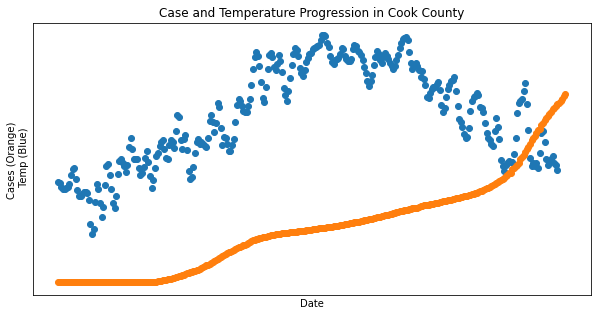

In [233]:
import matplotlib.pyplot as plt

# Now let's create the scatter plot
plt.figure(figsize=(10, 5))

# Scatter plot for population vs cases
plt.scatter(cook['date'],cook['mean_temp_3d_avg'])
plt.scatter(cook['date'],cook['cases']/5000)
# Adding title and labels
plt.title('Case and Temperature Progression in Cook County')
plt.xlabel('Date')
plt.ylabel('Cases (Orange) \n Temp (Blue)')
plt.tick_params(labelbottom = False, labelleft = False, left = False, bottom = False)

# Show the plot
plt.show()

In [217]:
la = data[data['entity']=='California-Los Angeles']

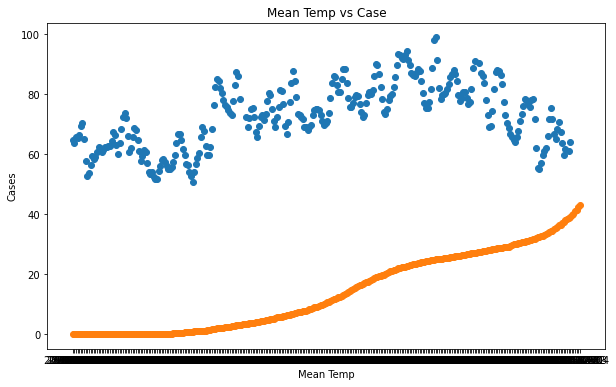

In [218]:
import matplotlib.pyplot as plt

# Now let's create the scatter plot
plt.figure(figsize=(10, 6))

# Scatter plot for population vs cases
plt.scatter(la['date'],la['mean_temp_3d_avg'])
plt.scatter(la['date'],la['cases']/10000)
# Adding title and labels
plt.title('Mean Temp vs Case')
plt.xlabel('Mean Temp')
plt.ylabel('Cases')

# Show the plot
plt.show()

In [234]:
cook.head()

,date,county,state,fips,cases,deaths,stay_at_home_announced,stay_at_home_effective,lat,lon,...,min_temp_5d_avg,min_temp_10d_avg,min_temp_15d_avg,dewpoint_3d_avg,dewpoint_5d_avg,dewpoint_10d_avg,dewpoint_15d_avg,date_stay_at_home_announced,date_stay_at_home_effective,entity
3,2020-01-24,Cook,Illinois,17031,1,0.0,no,no,41.840039,-87.816716,...,30.02,27.43,24.886667,31.433333,28.50,25.00,22.693333,2020-03-20,2020-03-21,Illinois-Cook
6,2020-01-25,Cook,Illinois,17031,1,0.0,no,no,41.840039,-87.816716,...,30.80,28.81,25.953333,32.233333,29.98,25.96,24.000000,2020-03-20,2020-03-21,Illinois-Cook
11,2020-01-26,Cook,Illinois,17031,1,0.0,no,no,41.840039,-87.816716,...,31.20,30.19,27.080000,29.600000,30.02,27.15,24.266667,2020-03-20,2020-03-21,Illinois-Cook
16,2020-01-27,Cook,Illinois,17031,1,0.0,no,no,41.840039,-87.816716,...,30.40,31.09,28.880000,27.400000,28.00,28.27,26.313333,2020-03-20,2020-03-21,Illinois-Cook
21,2020-01-28,Cook,Illinois,17031,1,0.0,no,no,41.840039,-87.816716,...,29.96,31.49,29.873333,26.000000,26.10,28.76,27.246667,2020-03-20,2020-03-21,Illinois-Cook


In [238]:
list = sub_data.columns
print(list[:-1])

Index(['percentile_rank_age_65_and_older',
       'percentile_rank_age_17_and_younger', 'percentile_rank_disabled',
       'percentile_rank_single_parent_households',
       'percentile_rank_household_comp_disability_theme',
       'percentile_rank_minorities',
       'percentile_rank_limited_english_abilities',
       'percentile_rank_minority_status_and_language_theme',
       'percentile_rank_multi_unit_housing', 'percentile_rank_mobile_homes',
       'percentile_rank_overcrowding', 'percentile_rank_no_vehicle',
       'percentile_rank_institutionalized_in_group_quarters',
       'percentile_rank_housing_and_transportation',
       'percentile_rank_social_vulnerability', 'km_to_closest_station', 'CALL',
       'ELEV_M', 'station_id', 'station_name', 'mean_temp', 'min_temp',
       'max_temp', 'dewpoint', 'sea_level_pressure', 'station_pressure',
       'visibility', 'wind_speed', 'max_wind_speed', 'wind_gust',
       'precipitation', 'precip_flag', 'fog', 'rain', 'snow', 'hail',
   

In [69]:
county = pd.read_csv('finalized_county.csv')

In [4]:
county.head()

,Unnamed: 0,date,fips,cases,deaths,stay_at_home_announced,stay_at_home_effective,lat,lon,total_population,...,min_temp_5d_avg,min_temp_10d_avg,min_temp_15d_avg,dewpoint_3d_avg,dewpoint_5d_avg,dewpoint_10d_avg,dewpoint_15d_avg,date_stay_at_home_announced,date_stay_at_home_effective,entity
0,0,2020-01-21,53061,1,0.0,no,no,48.047489,-121.697307,758649.0,...,38.92,38.44,36.146667,40.333333,41.64,40.74,37.973333,2020-03-23,2020-03-23,Washington-Snohomish
1,1,2020-01-22,53061,1,0.0,no,no,48.047489,-121.697307,758649.0,...,41.12,39.76,37.613333,42.633333,42.98,41.68,39.440000,2020-03-23,2020-03-23,Washington-Snohomish
2,2,2020-01-23,53061,1,0.0,no,no,48.047489,-121.697307,758649.0,...,41.74,41.15,38.226667,44.733333,43.72,42.47,40.120000,2020-03-23,2020-03-23,Washington-Snohomish
3,3,2020-01-24,17031,1,0.0,no,no,41.840039,-87.816716,5227575.0,...,30.02,27.43,24.886667,31.433333,28.50,25.00,22.693333,2020-03-20,2020-03-21,Illinois-Cook
4,4,2020-01-24,53061,1,0.0,no,no,48.047489,-121.697307,758649.0,...,42.54,41.75,38.226667,46.000000,44.30,42.88,41.293333,2020-03-23,2020-03-23,Washington-Snohomish


In [60]:
import pandas as pd

correlation_matrix = county.corr()
threshold = 0.99 

highly_correlated_vars = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            highly_correlated_vars.add((correlation_matrix.columns[i], correlation_matrix.columns[j]))

best_predictors = {}
for var1, var2 in highly_correlated_vars:
    corr_with_response_var1 = abs(correlation_matrix.loc[var1, 'incremental_cases'])
    corr_with_response_var2 = abs(correlation_matrix.loc[var2, 'incremental_cases'])
    if corr_with_response_var1 >= corr_with_response_var2:
        best_predictors[var2] = var1
    else:
        best_predictors[var1] = var2

for var in best_predictors:
    print(f"For {var} vs. {best_predictors[var]}: Choose {best_predictors[var]}")




For population vs. num_disabled: Choose num_disabled
For num_age_17_and_younger vs. population: Choose population
For num_no_highschool_diploma vs. num_unemployed_CHR: Choose num_unemployed_CHR
For num_some_college vs. total_population: Choose total_population
For num_households_CDC vs. population_2: Choose population_2
For percent_not_proficient_in_english vs. percent_limited_english_abilities: Choose percent_limited_english_abilities
For num_households_CHR vs. population_2: Choose population_2
For num_single_parent_households_CDC vs. num_single_parent_households_CHR: Choose num_single_parent_households_CHR
For num_disabled vs. num_below_poverty: Choose num_below_poverty
For total_population vs. num_housing_units: Choose num_housing_units
For percent_severe_housing_cost_burden vs. severe_housing_cost_burden: Choose severe_housing_cost_burden
For mean_temp_5d_avg vs. mean_temp_3d_avg: Choose mean_temp_3d_avg
For population_2 vs. num_minorities: Choose num_minorities
For percentile_rank

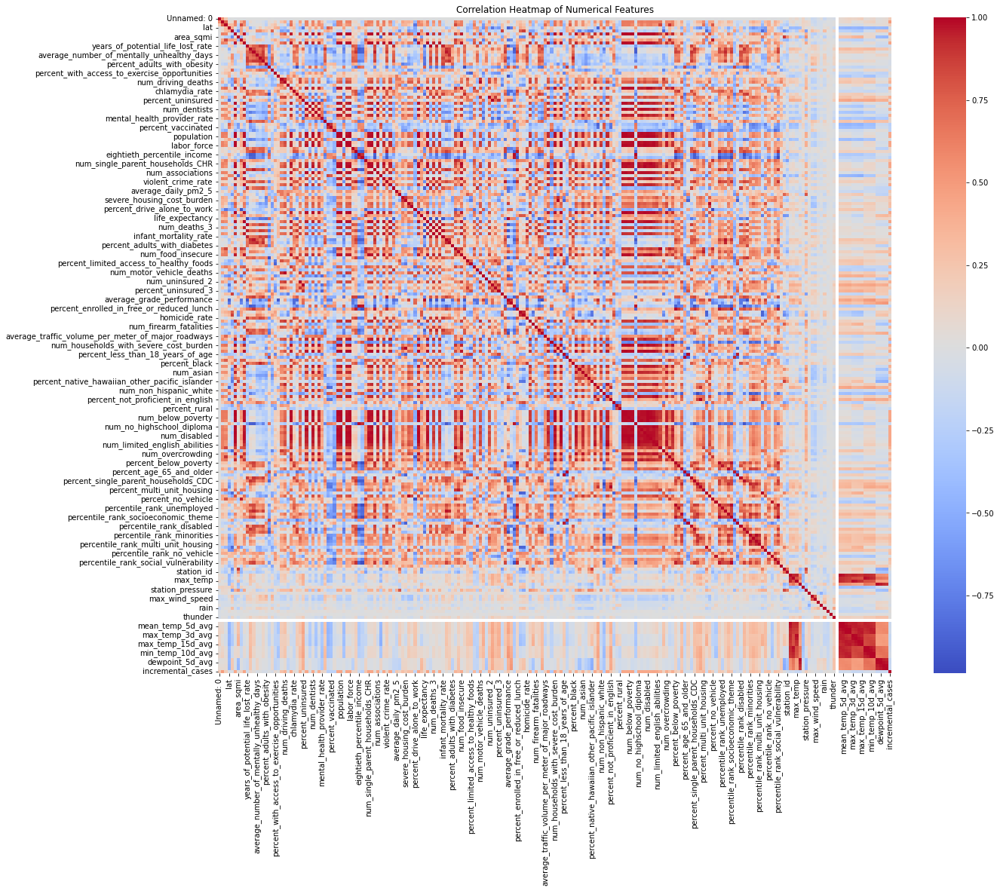

In [58]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

correlation_matrix = county.corr()

plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap of Numerical Features')
plt.show()


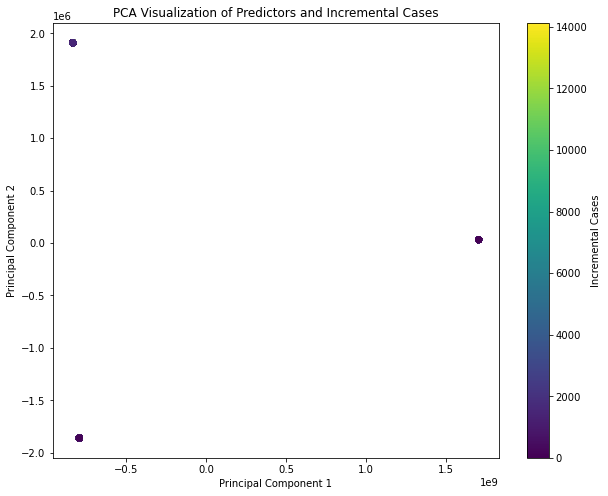

In [57]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
county_numeric = county.select_dtypes(include=['number'])

county_numeric = county_numeric.dropna()

X = county_numeric.drop(columns=['incremental_cases'])
y = county_numeric['incremental_cases']

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)
plt.figure(figsize=(10, 8))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, cmap='viridis')
plt.title('PCA Visualization of Predictors and Incremental Cases')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Incremental Cases')
plt.show()


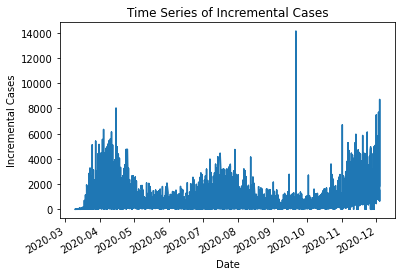

In [73]:
import pandas as pd
county = pd.read_csv('finalized_county.csv')
county['date'] = pd.to_datetime(county['date'])

county.set_index('date', inplace=True)

import matplotlib.pyplot as plt
county['incremental_cases'].plot()
plt.xlabel('Date')
plt.ylabel('Incremental Cases')
plt.title('Time Series of Incremental Cases')
plt.show()



In [76]:
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
county.index.freq = 'D'  
decomposition = seasonal_decompose(county['incremental_cases'], model='additive', )
fig = decomposition.plot()
plt.show()


ValueError: Inferred frequency None from passed values does not conform to passed frequency D

In [77]:

weather_features = [col for col in county.columns if 'temp' in col or 'dewpoint' in col or 'humidity' in col or 'precipitation' in col]
weather_data = county[weather_features]


In [78]:
avg_features = [col for col in weather_data.columns if '3d_avg' in col or '5d_avg' in col or '10d_avg' in col or '15d_avg' in col]
avg_weather_data = county[avg_features + ['incremental_cases']]


In [79]:
correlation_with_incremental_cases = avg_weather_data.corr()['incremental_cases'].sort_values(ascending=False)


In [80]:
correlation_with_incremental_cases

incremental_cases    1.000000
min_temp_15d_avg    -0.057284
min_temp_10d_avg    -0.062155
min_temp_5d_avg     -0.077943
min_temp_3d_avg     -0.080823
mean_temp_15d_avg   -0.085468
mean_temp_10d_avg   -0.090686
mean_temp_5d_avg    -0.106309
mean_temp_3d_avg    -0.110319
max_temp_15d_avg    -0.127426
max_temp_10d_avg    -0.132063
dewpoint_15d_avg    -0.135041
dewpoint_10d_avg    -0.138769
max_temp_5d_avg     -0.144993
dewpoint_5d_avg     -0.147602
dewpoint_3d_avg     -0.148832
max_temp_3d_avg     -0.148875
Name: incremental_cases, dtype: float64

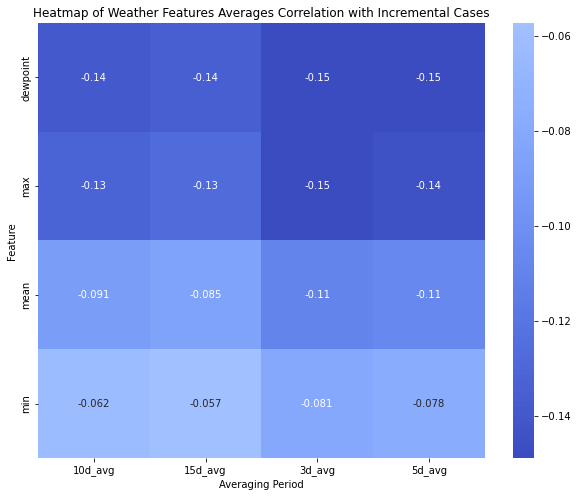

In [81]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
feature_names = [feature.split('_')[0] for feature in correlation_with_incremental_cases.index if feature != 'incremental_cases']
averaging_periods = [feature.split('_')[-2] + '_' + feature.split('_')[-1] for feature in correlation_with_incremental_cases.index if feature != 'incremental_cases']
heatmap_data = pd.DataFrame({
    'Feature': feature_names,
    'Averaging Period': averaging_periods,
    'Correlation': correlation_with_incremental_cases.drop('incremental_cases').values
})

heatmap_data_pivot = heatmap_data.pivot("Feature", "Averaging Period", "Correlation")
plt.figure(figsize=(10, 8))
sns.heatmap(heatmap_data_pivot, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of Weather Features Averages Correlation with Incremental Cases')
plt.show()


In [82]:
import matplotlib.pyplot as plt

def plot_time_series_for_all_entities(data):

    unique_entities = county['entity'].unique()

    plt.figure(figsize=(15, 5 * len(unique_entities)))
    
    for i, entity in enumerate(unique_entities):
        entity_data = county[county['entity'] == entity]
        plt.subplot(len(unique_entities), 1, i+1)
        plt.plot(entity_data['date'], entity_data['incremental_cases'], label=entity)
        plt.title(f'Time Series of Incremental Cases - {entity}')
        plt.xlabel('Date')
        plt.ylabel('Incremental Cases')
        plt.xticks(rotation=45)
        plt.tight_layout()

    plt.show()


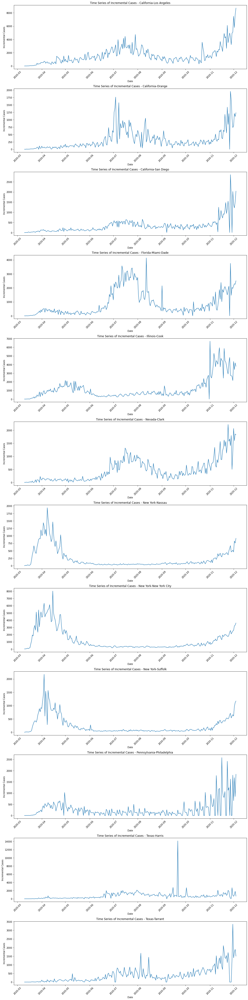

In [85]:
county = pd.read_csv('finalized_county.csv')
county['date'] = pd.to_datetime(county['date'])
plot_time_series_for_all_entities(county)


In [142]:


county = county.drop(columns=[col for col in county.columns if 'death' in col])
variable_selected = pd.read_csv('variable_selected_county_dataset.csv')


In [143]:
def plot_selected_factors_3d(data, income_variable, response_variable):

    selected_variables = [col for col in variable_selected.columns if ('perc' in col or 'dewpoint_3d_avg' or 'num' in col) 
                          and col not in [income_variable, response_variable]]

    for variable in selected_variables:
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')
        if pd.api.types.is_numeric_dtype(data[variable]):
            x = data[income_variable]
            y = data[variable]
            z = data[response_variable]

            ax.scatter(x, y, z, c='blue', marker='o')
            ax.set_xlabel(income_variable)
            ax.set_ylabel(variable)
            ax.set_zlabel(response_variable)
            plt.title(f'3D Plot of {variable}, {income_variable} vs. {response_variable}')
            plt.show()


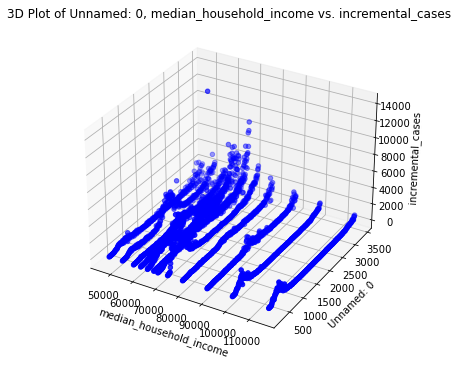

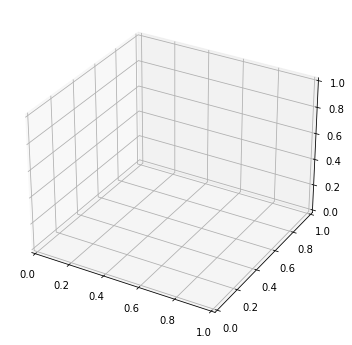

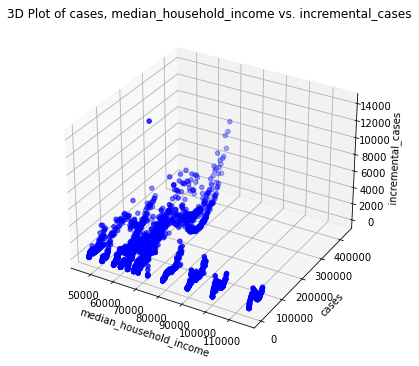

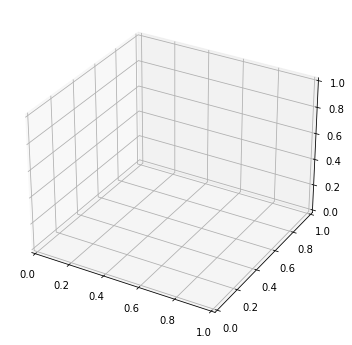

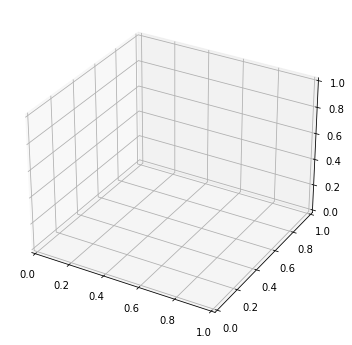

...

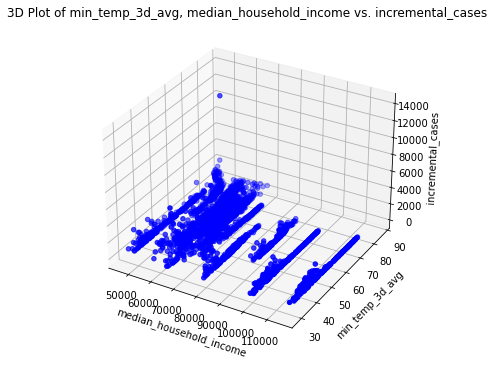

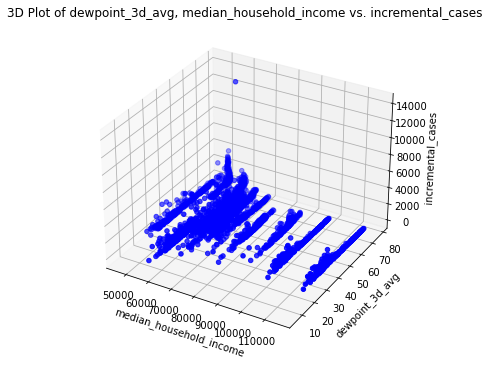

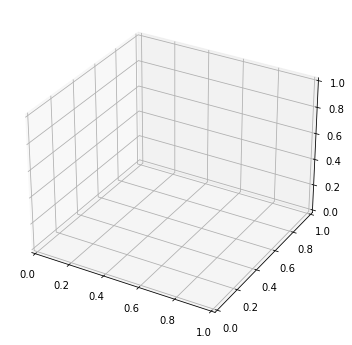

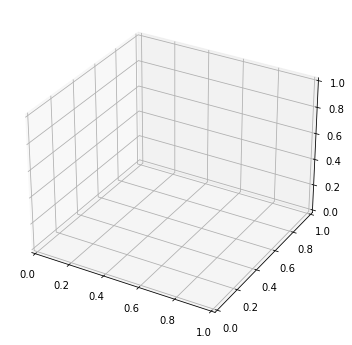

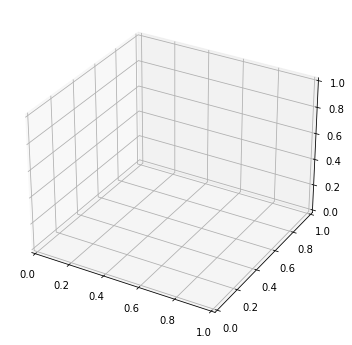

In [144]:
income_var = 'median_household_income'  
response_var = 'incremental_cases'

plot_selected_factors_3d(variable_selected, income_var, response_var)


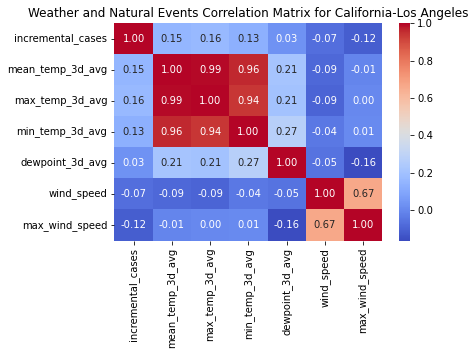

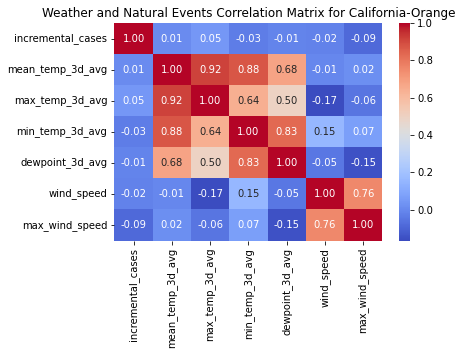

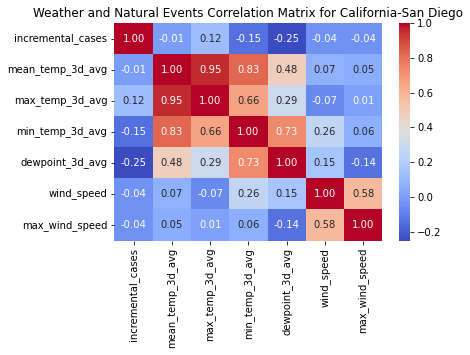

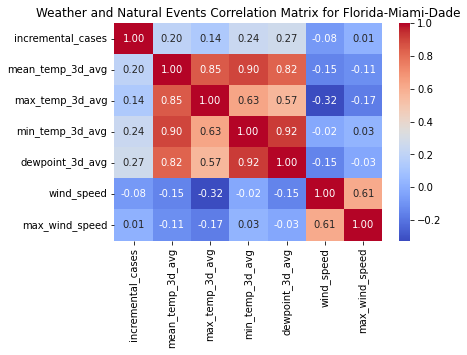

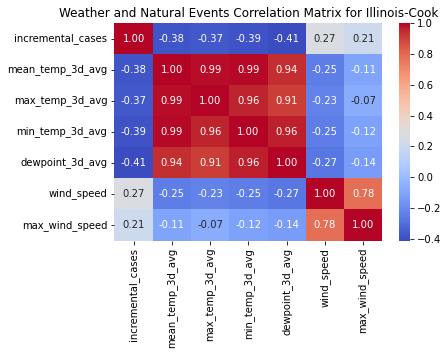

...

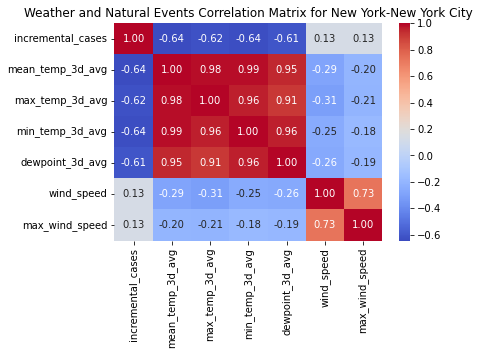

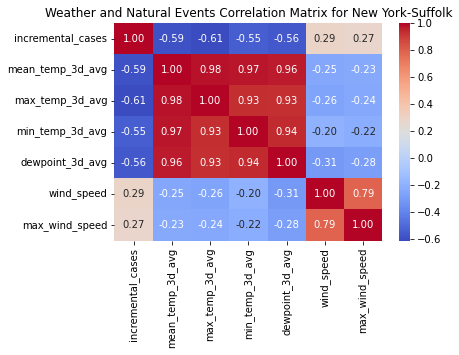

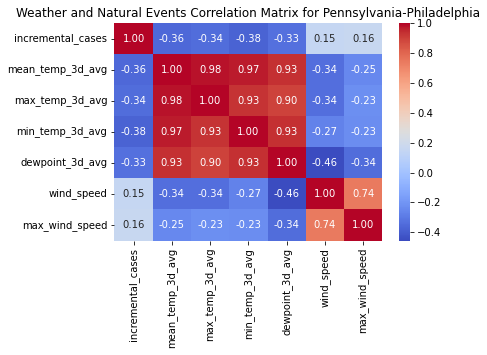

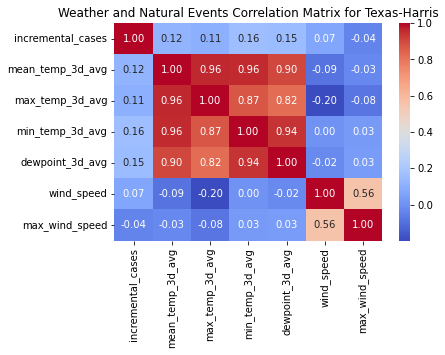

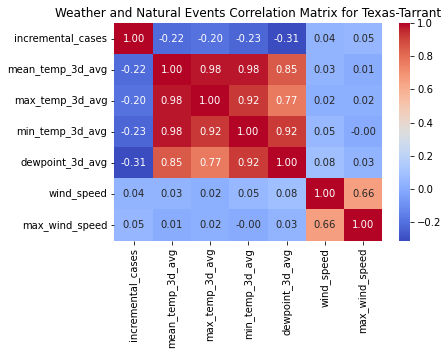

In [136]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

variable_selected = pd.read_csv('variable_selected_county_dataset.csv')

variable_selected['date'] = pd.to_datetime(variable_selected['date'])

weather_natural_columns = [
    'incremental_cases',
    'mean_temp_3d_avg',
    'max_temp_3d_avg',
    'min_temp_3d_avg',
    'dewpoint_3d_avg',
    'wind_speed',
    'max_wind_speed'
]

for entity in variable_selected['entity'].unique():
    variable_selected_entity = variable_selected[variable_selected['entity'] == entity]
    
    if variable_selected_entity.shape[0] > 30:  
        corr_matrix_entity = variable_selected_entity[weather_natural_columns].corr()
        
        plt.figure(figsize=(6, 4))
        sns.heatmap(corr_matrix_entity, annot=True, cmap='coolwarm', fmt=".2f")
        plt.title(f'Weather and Natural Events Correlation Matrix for {entity}')
        plt.show()


In [113]:

correlation_df = pd.DataFrame(columns=['Entity'] + weather_natural_columns)

for entity in variable_selected['entity'].unique():
    df_entity = variable_selected[variable_selected['entity'] == entity]
    corr_row = {'Entity': entity}
    for feature in weather_natural_columns:
        if df_entity.shape[0] > 30:  # Check to ensure sufficient data points
            corr_coefficient = df_entity[['incremental_cases', feature]].corr().abs().iloc[0, 1]
            corr_row[feature] = corr_coefficient
        else:
            corr_row[feature] = None  
    correlation_df = correlation_df.append(corr_row, ignore_index=True)

rankings = {}

for feature in weather_natural_columns:
    sorted_entities = correlation_df[['Entity', feature]].sort_values(by=feature, ascending=False).reset_index(drop=True)
    rankings[feature] = sorted_entities
for feature in weather_natural_columns:
    print(f"Ranking for '{feature}':")
    print(rankings[feature].head(12))  


Ranking for 'incremental_cases':
                       Entity incremental_cases
0      California-Los Angeles               1.0
1           California-Orange               1.0
2        California-San Diego               1.0
3          Florida-Miami-Dade               1.0
4               Illinois-Cook               1.0
5                Nevada-Clark               1.0
6             New York-Nassau               1.0
7      New York-New York City               1.0
8            New York-Suffolk               1.0
9   Pennsylvania-Philadelphia               1.0
10               Texas-Harris               1.0
11              Texas-Tarrant               1.0
Ranking for 'mean_temp_3d_avg':
                       Entity mean_temp_3d_avg
0      New York-New York City         0.643259
1            New York-Suffolk         0.588894
2             New York-Nassau          0.58377
3               Illinois-Cook         0.383154
4   Pennsylvania-Philadelphia         0.363267
5               Texas-Tarrant

/var/folders/f5/v23gj0gj0_jc4w26rhk8n_100000gn/T/ipykernel_95501/2216256958.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append(corr_row, ignore_index=True)
/var/folders/f5/v23gj0gj0_jc4w26rhk8n_100000gn/T/ipykernel_95501/2216256958.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append(corr_row, ignore_index=True)
/var/folders/f5/v23gj0gj0_jc4w26rhk8n_100000gn/T/ipykernel_95501/2216256958.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  correlation_df = correlation_df.append(corr_row, ignore_index=True)
/var/folders/f5/v23gj0gj0_jc4w26rhk8n_100000gn/T/ipykernel_95501/2216256958.py:12: FutureWarning: The frame.append method is deprecated and wi

{'incremental_cases':                        Entity incremental_cases
 0      California-Los Angeles               1.0
 1           California-Orange               1.0
 2        California-San Diego               1.0
 3          Florida-Miami-Dade               1.0
 4               Illinois-Cook               1.0
 5                Nevada-Clark               1.0
 6             New York-Nassau               1.0
 7      New York-New York City               1.0
 8            New York-Suffolk               1.0
 9   Pennsylvania-Philadelphia               1.0
 10               Texas-Harris               1.0
 11              Texas-Tarrant               1.0,
 'mean_temp_3d_avg':                        Entity mean_temp_3d_avg
 0      New York-New York City         0.643259
 1            New York-Suffolk         0.588894
 2             New York-Nassau          0.58377
 3               Illinois-Cook         0.383154
 4   Pennsylvania-Philadelphia         0.363267
 5               Texas-Tarrant   

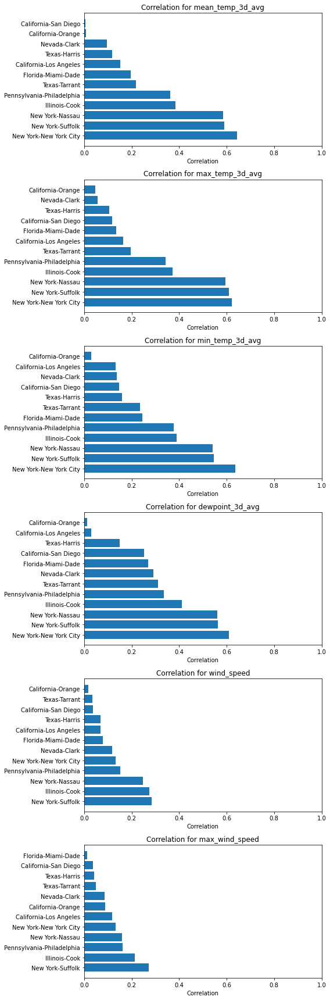

In [127]:
import matplotlib.pyplot as plt
import numpy as np

features = [
    'mean_temp_3d_avg', 'max_temp_3d_avg', 'min_temp_3d_avg',
    'dewpoint_3d_avg', 'wind_speed', 'max_wind_speed']

fig, axes = plt.subplots(nrows=len(features), figsize=(8, 4 * len(features)))

for i, feature in enumerate(features):

    feature_ranking = rankings[feature]

    entities = feature_ranking['Entity']
    correlations = feature_ranking[feature]
    axes[i].barh(entities, correlations)
    axes[i].set_xlabel('Correlation')
    axes[i].set_title(f'Correlation for {feature}')
    axes[i].set_xlim(0, 1.0)

plt.tight_layout()

plt.show()


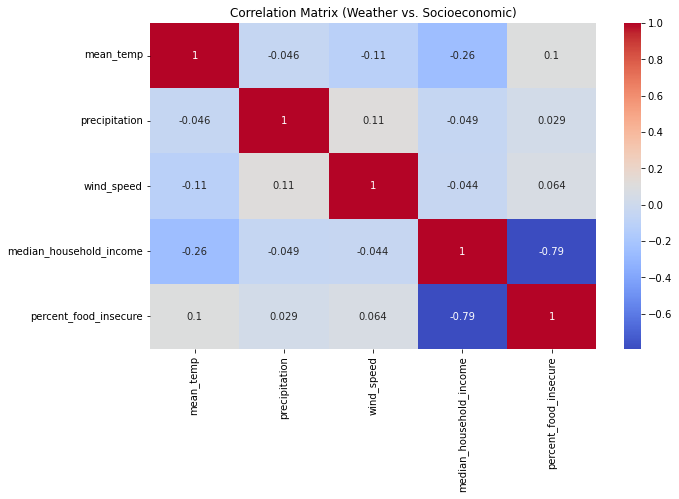

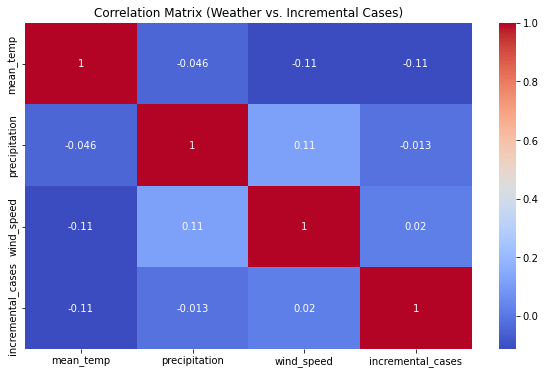

In [133]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

weather_variables = ['mean_temp', 'precipitation', 'wind_speed'] 
socioeconomic_variables = ['median_household_income', 'percent_food_insecure'] 

correlation_matrix_weather_socioeconomic = variable_selected[weather_variables + socioeconomic_variables].corr()

correlation_matrix_weather_cases = variable_selected[weather_variables + ['incremental_cases']].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_weather_socioeconomic, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix (Weather vs. Socioeconomic)')
plt.show()

plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix_weather_cases, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix (Weather vs. Incremental Cases)')
plt.show()
variable_selected_1 = variable_selected.dropna()
p_values = {}
for variable in weather_variables + socioeconomic_variables:
    corr, p_value = pearsonr(variable_selected_1[variable], variable_selected_1['incremental_cases'])
    p_values[variable] = p_value


In [134]:
for variable, p_value in p_values.items():
    print(f"P-value for correlation between '{variable}' and 'incremental_cases': {p_value:.4f}")


P-value for correlation between 'mean_temp' and 'incremental_cases': 0.0067
P-value for correlation between 'precipitation' and 'incremental_cases': 0.1729
P-value for correlation between 'wind_speed' and 'incremental_cases': 0.1498
P-value for correlation between 'median_household_income' and 'incremental_cases': 0.0000
P-value for correlation between 'percent_food_insecure' and 'incremental_cases': 0.0000
